<a href="https://colab.research.google.com/github/ajaysuseel/MiniProject_AD/blob/main/hazard_detection_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import json
import spacy
import torch
import requests
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
from sentence_transformers import SentenceTransformer, util
from transformers import BlipProcessor, BlipForConditionalGeneration

In [17]:
import torch.nn.functional as F

In [2]:
def load_json(file_path):
    """Loads data from a JSON file."""
    with open(file_path, "r", encoding="utf-8") as file:
        return json.load(file)

In [27]:
!rm -rf MiniProject_AD

In [28]:
!git clone https://github.com/ajaysuseel/MiniProject_AD.git

Cloning into 'MiniProject_AD'...
remote: Enumerating objects: 1952, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 1952 (delta 13), reused 15 (delta 5), pack-reused 1923 (from 3)
Receiving objects: 100% (1952/1952), 243.67 MiB | 28.63 MiB/s, done.
Resolving deltas: 100% (196/196), done.
Updating files: 100% (2116/2116), done.


In [24]:
# Load hazard keywords and base cases from JSON
keywords_data = load_json("/content/MiniProject_AD/Hazard_detection/keywords.json")
basecases_data = load_json("/content/MiniProject_AD/Hazard_detection/basecases.json")

# Extract data
hazard_keywords = keywords_data.get("hazard_keywords", [])
hazard_cases = basecases_data.get("hazard_cases", [])
no_hazard_cases = basecases_data.get("no_hazard_cases", [])

In [6]:
# Load NLP and Sentence Transformer models
nlp = spacy.load("en_core_web_sm")
sbert_model = SentenceTransformer("sentence-transformers/all-MiniLM-L6-v2")

# Precompute embeddings for hazard and non-hazard cases
hazard_embeddings = sbert_model.encode(hazard_cases, convert_to_tensor=True)
no_hazard_embeddings = sbert_model.encode(no_hazard_cases, convert_to_tensor=True)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [26]:
def load_model_and_processor(model_path):
    try:
        # Load processor (used for transforming the image and text)
        processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")

        # Load model (the architecture for generating captions)
        model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

        # If you have a checkpoint, load it here
        checkpoint = torch.load(model_path, map_location="cpu")
        state_dict = checkpoint["state_dict"]

        # Update model with checkpoint state dict
        new_state_dict = {k.replace("model.", ""): v for k, v in state_dict.items()}
        model.load_state_dict(new_state_dict, strict=False)

        # Setup device to GPU if available, otherwise CPU
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model.to(device)
        model.eval()  # Set model to evaluation mode

        print(f"✅ Model loaded successfully on {device}")
        return model, processor, device
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        return None, None, None

def detect_hazard_ner(caption):
    """
    Detects hazard using NER keyword matching.
    Returns "Hazard" if any hazard keyword is found, otherwise "No Hazard".
    """
    doc = nlp(caption.lower())
    if any(token.text in hazard_keywords for token in doc):
        return "Hazard"
    return "No Hazard"

def detect_hazard_similarity(caption):
    """
    Detects hazard based on semantic similarity with known hazard cases.
    Returns a tuple of (hazard_prob, no_hazard_prob) using softmax on similarity scores.
    """
    caption_embedding = sbert_model.encode(caption, convert_to_tensor=True)
    hazard_similarities = util.pytorch_cos_sim(caption_embedding, hazard_embeddings)
    no_hazard_similarities = util.pytorch_cos_sim(caption_embedding, no_hazard_embeddings)

    max_hazard_score = torch.max(hazard_similarities).item()
    max_no_hazard_score = torch.max(no_hazard_similarities).item()

    scores = torch.tensor([max_hazard_score, max_no_hazard_score])
    probabilities = F.softmax(scores, dim=0)

    hazard_prob = probabilities[0].item()
    no_hazard_prob = probabilities[1].item()

    return hazard_prob, no_hazard_prob

def detect_hazard(caption):
    """
    Final hazard detection logic.
    Primarily uses the similarity-based probability, adding a small boost if NER detects a hazard.
    Final classification is based on whichever probability is greater.
    """
    sim_hazard_prob, sim_no_hazard_prob = detect_hazard_similarity(caption)
    ner_result = detect_hazard_ner(caption)

    # If NER finds a hazard, add a small boost to the similarity hazard probability.
    boosted_sim_hazard = sim_hazard_prob + (NER_BOOST if ner_result == "Hazard" else 0.0)

    if boosted_sim_hazard > sim_no_hazard_prob:
        return "Hazard", boosted_sim_hazard, sim_no_hazard_prob
    else:
        return "No Hazard", boosted_sim_hazard, sim_no_hazard_prob


def list_local_images(folder_path):
    """Fetches the list of image file paths from a local directory."""
    valid_extensions = {".jpg", ".jpeg", ".png"}  # Supported image formats
    return [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.lower().endswith(tuple(valid_extensions))]

def load_image_from_path(image_path):
    """Loads an image from a local file path."""
    try:
        return Image.open(image_path)
    except Exception as e:
        print(f"❌ Error loading image {image_path}: {e}")
        return None


def generate_caption(model, processor, device, image):
    try:
        inputs = processor(images=image, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}
        with torch.no_grad():
            output_ids = model.generate(**inputs)
        return processor.decode(output_ids[0], skip_special_tokens=True)
    except Exception as e:
        print(f"Error generating caption: {e}")
        return ""

def process_and_plot_images(image_paths, model, processor, device):
    """
    Processes images, generates captions, and plots the image with the final hazard detection result.
    """
    for image_path in image_paths:
        image = load_image_from_path(image_path)  # Ensure you have a load_image_from_path() for local images
        if image:
            caption = generate_caption(model, processor, device, image)
            hazard_status, hazard_prob, no_hazard_prob = detect_hazard(caption)

            plt.figure(figsize=(6, 6))
            plt.imshow(image)
            plt.axis("off")
            plt.title(
                f"Hazard Status: {hazard_status}\n"
                f"Caption: {caption}\n"
                f"Hazard Probability: {hazard_prob:.2f}\n"
                f"No-Hazard Probability: {no_hazard_prob:.2f}"
            )
            plt.show()


In [8]:
from google.colab import drive
import shutil
import os

# 🚀 Mount Google Drive
drive.mount('/content/drive')

# 🔹 Source (Google Drive folder)
src_folder = "/content/drive/MyDrive/lightning_models/models/checkpoints"

# 🔹 Destination (Colab models folder)
dest_folder = "/content/checkpoints"

# # 🗑️ Remove existing folder if it exists
# if os.path.exists(dest_folder):
#     shutil.rmtree(dest_folder)
#     print("⚠️ Existing 'models' folder deleted.")

# 🔄 Copy the folder from Drive
shutil.copytree(src_folder, dest_folder)
print("✅ Models folder copied successfully from Drive!")

Mounted at /content/drive
✅ Models folder copied successfully from Drive!


In [9]:
drive.flush_and_unmount()

In [19]:
model_path = "/content/checkpoints/blip_best.ckpt"  # Replace with actual checkpoint path
model, processor, device = load_model_and_processor(model_path)


✅ Model loaded successfully on cpu


In [30]:
NER_BOOST = 0.2  # Define the boost value for NER

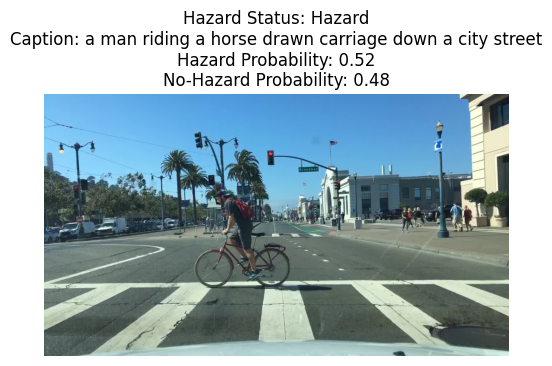

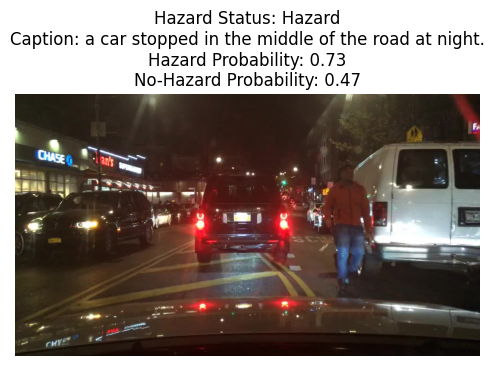

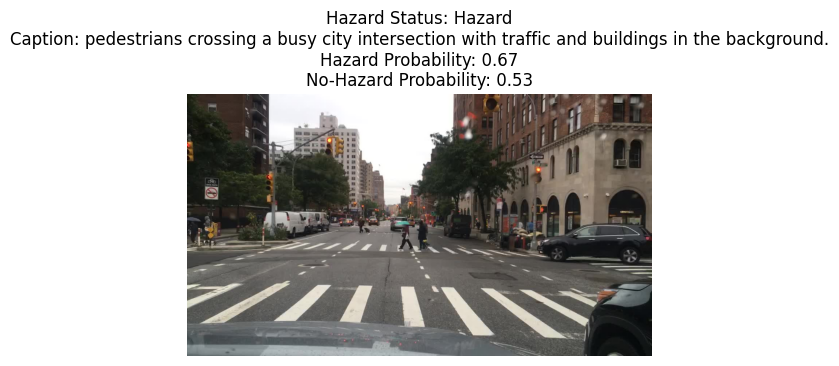

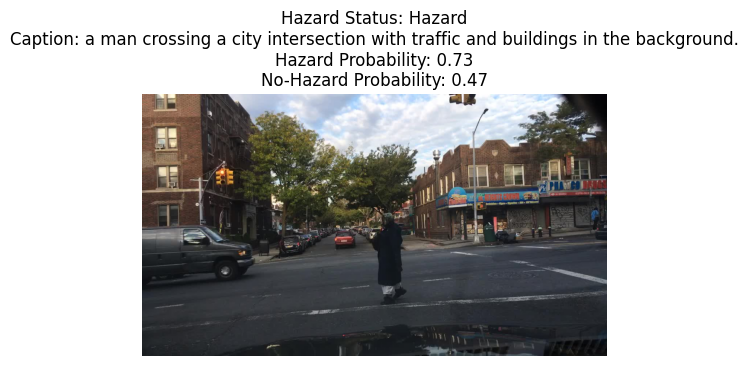

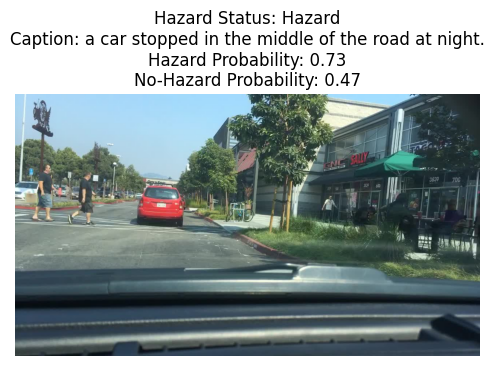

...

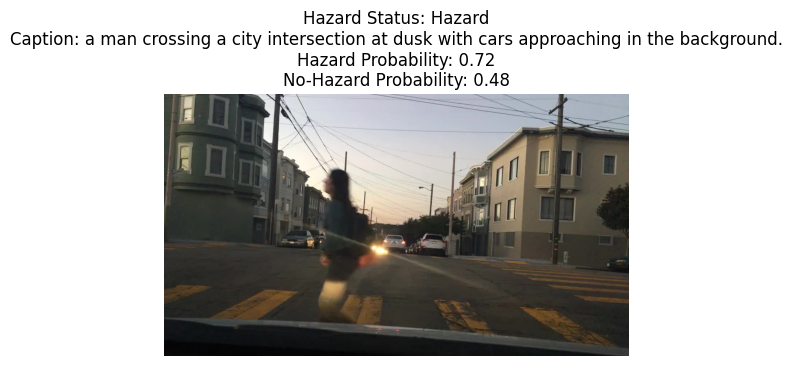

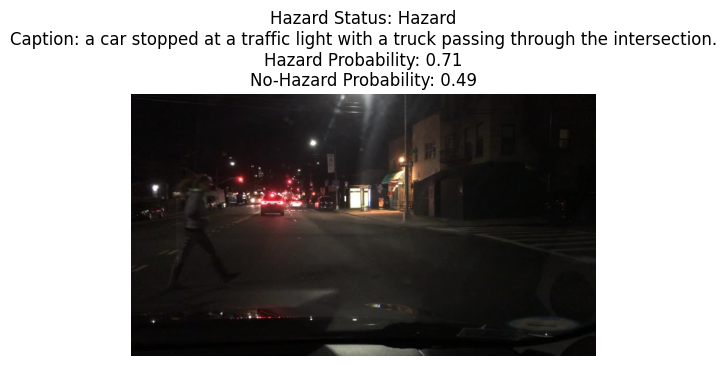

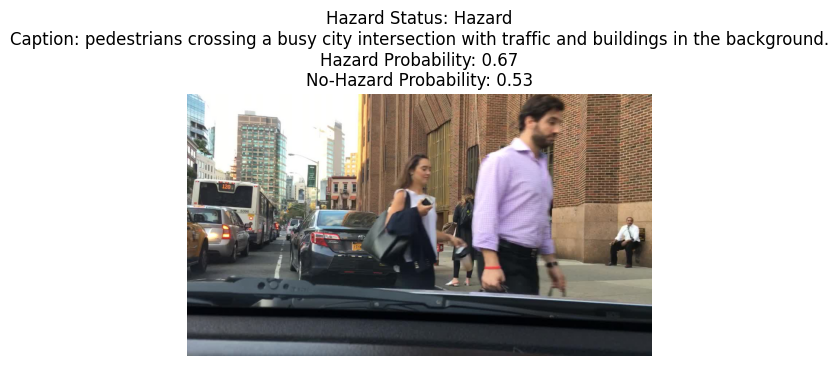

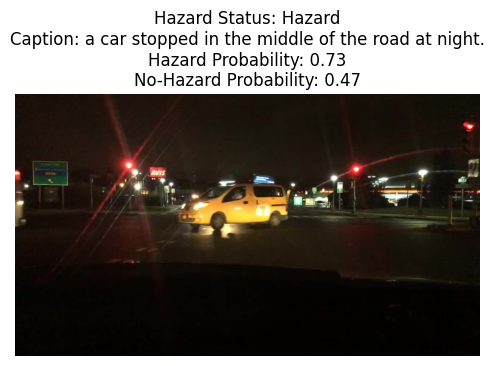

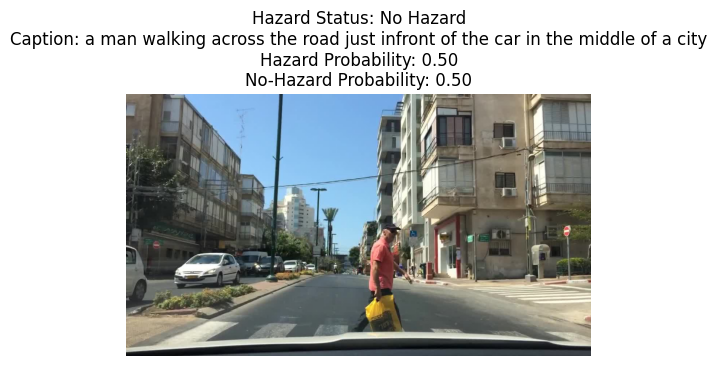

In [31]:
image_folder = "/content/MiniProject_AD/raw_data/kishan/images"  # Replace with the actual folder path
image_paths = list_local_images(image_folder)

if image_paths:
    process_and_plot_images(image_paths, model, processor, device)
else:
    print("❌ No images found in the folder.")
